<a href="https://colab.research.google.com/github/muhamadfadil316/MACHINE-LEARNING/blob/main/PraktikumMandiri11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Praktikum Mandiri menggunakan clustering DBSCAN

In [ ]:
!pip install folium
!pip install contextily

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
import folium

from folium.plugins import HeatMap
import geopandas as gpd
import contextily as ctx
from mpl_toolkits.axes_grid1 import make_axes_locatable
from shapely import wkt

In [ ]:
df_gempa = pd.read_csv("/content/earthquake.csv")
df_gempa.head()

,date,time,latitude,longitude,depth,magnitude
0,2008-11-01,00:31:25,-0.60,98.89553,20.0,2.99
1,2008-11-01,01:34:29,-6.61,129.38722,30.1,5.51
2,2008-11-01,01:38:14,-3.65,127.99068,5.0,3.54
3,2008-11-01,02:20:05,-4.20,128.09700,5.0,2.42
4,2008-11-01,02:32:18,-4.09,128.20047,10.0,2.41


In [ ]:
df_gempa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87372 entries, 0 to 87371
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date       87372 non-null  object 
 1   time       87372 non-null  object 
 2   latitude   87372 non-null  float64
 3   longitude  87372 non-null  float64
 4   depth      87372 non-null  float64
 5   magnitude  87372 non-null  float64
dtypes: float64(4), object(2)
memory usage: 4.0+ MB


In [ ]:
df_gempa.isnull().sum()

,0
date,0
time,0
latitude,0
longitude,0
depth,0
magnitude,0


In [ ]:
df_gempa.duplicated().sum()

np.int64(2679)

In [ ]:
df_gempa = df_gempa.drop_duplicates()

In [ ]:
df_gempa.duplicated().sum()

np.int64(0)

In [ ]:
# Buat peta dasar indonesia
peta_indonesia = folium.Map(location=[-2.5, 118.0], zoom_start=5)

# Buat list data [latitude, longitude, value] untuk heatmap
data_heatmap = df_gempa[['latitude', 'longitude', 'magnitude']].values.tolist()

# Tambahkan heatmap ke peta indonesia
HeatMap(
    data_heatmap,
    radius=12,
    blur=15, max_zoom=6).add_to(peta_indonesia)

# Tampilkan peta
peta_indonesia

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec

# Jitter koordinat agar tidak tumpang tindih
np.random.seed(42)
long_peta = df_gempa['longitude'] + np.random.uniform(-0.05, 0.05, size=len(df_gempa))
lat_peta = df_gempa['latitude'] + np.random.uniform(-0.05, 0.05, size=len(df_gempa))

# Konversi ke GeoDataFrame
gdf_gempa = gpd.GeoDataFrame(
    df_gempa,
    geometry=gpd.points_from_xy(long_peta, lat_peta),
    crs='EPSG:4326'
)

# Proyeksi ke Web Mercator
gdf_gempa = gdf_gempa.to_crs(epsg=3857)

persentase = df_gempa.groupby("depth")["magnitude"].mean()
top_5 = persentase.sort_values(ascending=False).head(5)
bottom_5 = persentase.sort_values().head(5)

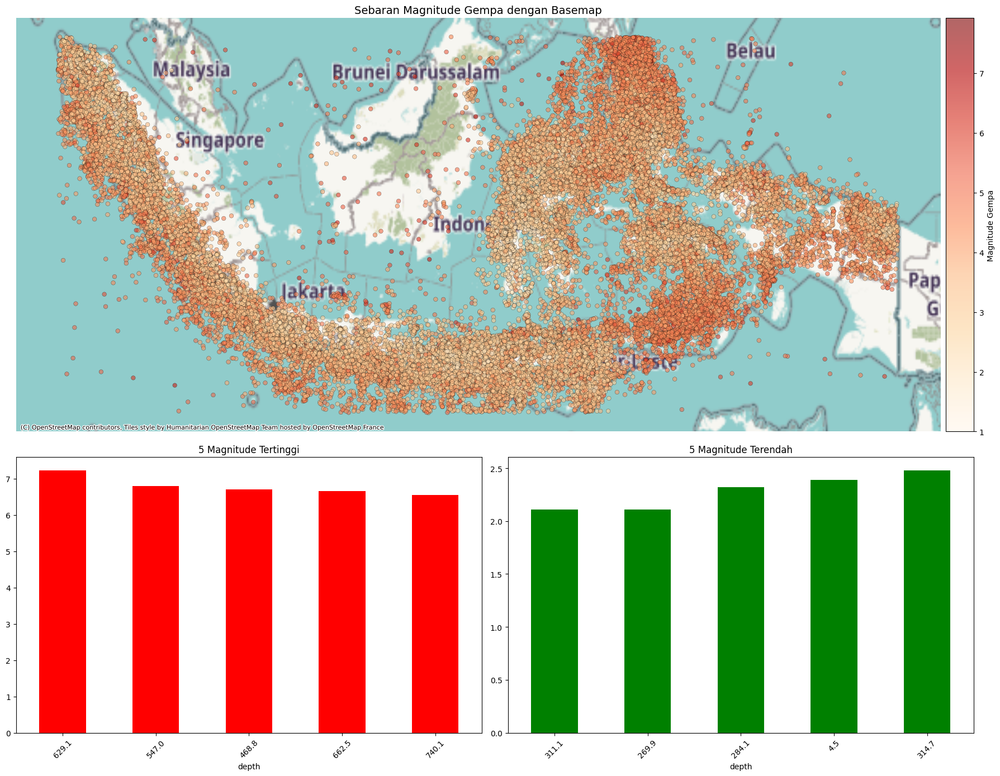

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec

# Layout
fig = plt.figure(figsize=(18, 14))
gs = gridspec.GridSpec(2, 2, height_ratios=[3, 2])

# --- ROW 1: Peta ---
ax_map = plt.subplot(gs[0, :])
divider = make_axes_locatable(ax_map)
cax = divider.append_axes("right", size="3%", pad=0.1)

# Plot manual pakai matplotlib scatter
sc = ax_map.scatter(
    gdf_gempa.geometry.x,
    gdf_gempa.geometry.y,
    c=gdf_gempa["magnitude"],
    cmap="OrRd",
    s=30,
    edgecolor="black",
    linewidth=0.3,
    alpha=0.6
)

# Tambahkan colorbar
cb = plt.colorbar(sc, cax=cax)
cb.set_label("Magnitude Gempa")

# Basemap
ctx.add_basemap(ax_map)
ax_map.set_title("Sebaran Magnitude Gempa dengan Basemap", fontsize=14)
ax_map.axis("off")

# --- ROW 2: Bar Chart TOP 5 ---
ax_top = plt.subplot(gs[1, 0])
top_5.plot(kind='bar', ax=ax_top, color='red')
ax_top.set_title("5 Magnitude Tertinggi")
ax_top.set_ylabel("")
ax_top.tick_params(axis='x', rotation=45)

# --- ROW 2: Bar Chart BOTTOM 5 ---
ax_bottom = plt.subplot(gs[1, 1])
bottom_5.plot(kind='bar', ax=ax_bottom, color='green')
ax_bottom.set_title("5 Magnitude Terendah")
ax_bottom.set_ylabel("")
ax_bottom.tick_params(axis='x', rotation=45)

plt.tight_layout()

In [ ]:
df_gempa.columns

Index(['date', 'time', 'latitude', 'longitude', 'depth', 'magnitude'], dtype='object')

In [ ]:
from scipy.stats import shapiro
# Uji Normalitas
normalityTest_df_gempa = df_gempa.drop(columns=['time', 'date'])

normalityTest_df_gempa.info()

<class 'pandas.core.frame.DataFrame'>
Index: 84693 entries, 0 to 87371
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   latitude   84693 non-null  float64
 1   longitude  84693 non-null  float64
 2   depth      84693 non-null  float64
 3   magnitude  84693 non-null  float64
dtypes: float64(4)
memory usage: 3.2 MB


In [ ]:
stat, p = shapiro(normalityTest_df_gempa)

print("Statik: ", stat)
print("P-value: ", p)

if p > 0.05:
    print("Data berdistribusi normal (tidak tolak H0)")
else:
    print("Data tidak berdistribusi normal (tolak H0)")

Statik:  0.7036117809210142
P-value:  1.4151356731567072e-172
Data tidak berdistribusi normal (tolak H0)


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 338772.
  res = hypotest_fun_out(*samples, **kwds)


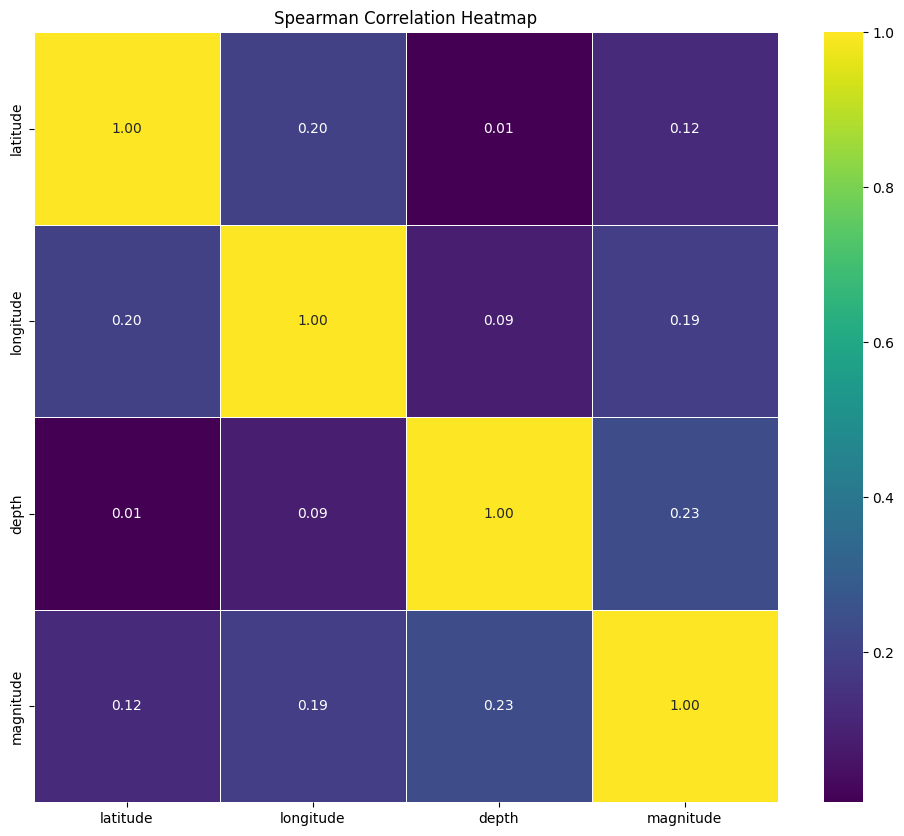

In [ ]:
correlation_df = normalityTest_df_gempa

correlation_matrix = correlation_df.corr(method='spearman')

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt=".2f", linewidths=0.5)
plt.title("Spearman Correlation Heatmap")
plt.show()

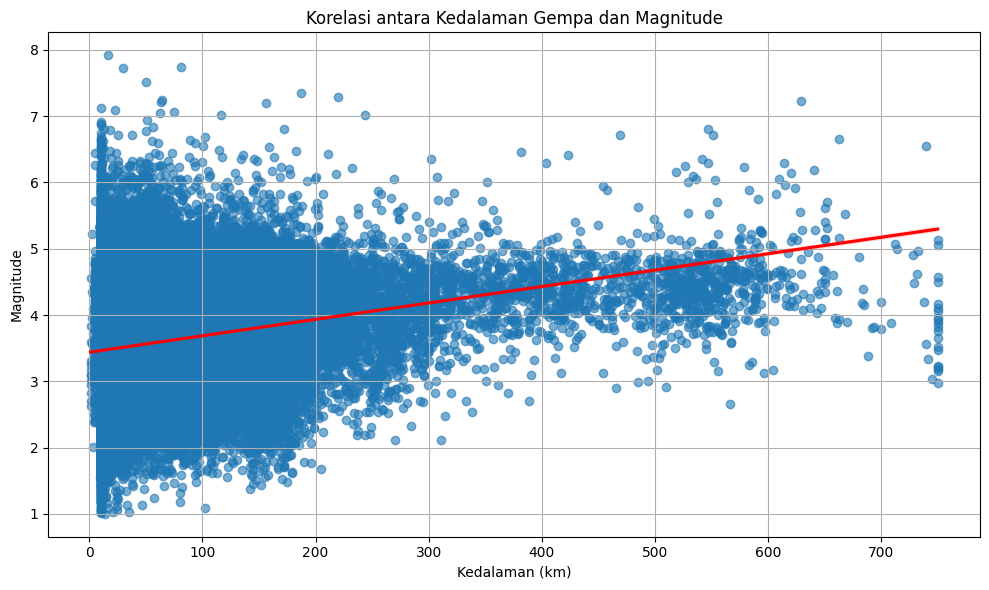

In [ ]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x="depth",
    y="magnitude",
    data=df_gempa,
    scatter_kws={'alpha':0.6},
    line_kws={"color": "red"}
)

plt.title("Korelasi antara Kedalaman Gempa dan Magnitude")
plt.xlabel("Kedalaman (km)")
plt.ylabel("Magnitude")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
normalisasi_df_gempa = df_gempa.drop(columns=['date', 'time'])
normalisasi_df_gempa.head()

,latitude,longitude,depth,magnitude
0,-0.60,98.89553,20.0,2.99
1,-6.61,129.38722,30.1,5.51
2,-3.65,127.99068,5.0,3.54
3,-4.20,128.09700,5.0,2.42
4,-4.09,128.20047,10.0,2.41


In [ ]:
# Proses Normalisasi dengan RobustScaler
from sklearn.preprocessing import RobustScaler

column_names = normalisasi_df_gempa.columns
scaler = RobustScaler()
normalisasi_df_gempa = scaler.fit_transform(normalisasi_df_gempa)
normalisasi_df_gempa = pd.DataFrame(normalisasi_df_gempa, columns=column_names)
normalisasi_df_gempa.head()

,latitude,longitude,depth,magnitude
0,0.286070,-1.740232,0.106383,-0.447368
1,-0.461443,0.639522,0.345154,1.763158
2,-0.093284,0.530528,-0.248227,0.035088
3,-0.161692,0.538826,-0.248227,-0.947368
4,-0.148010,0.546901,-0.130024,-0.956140


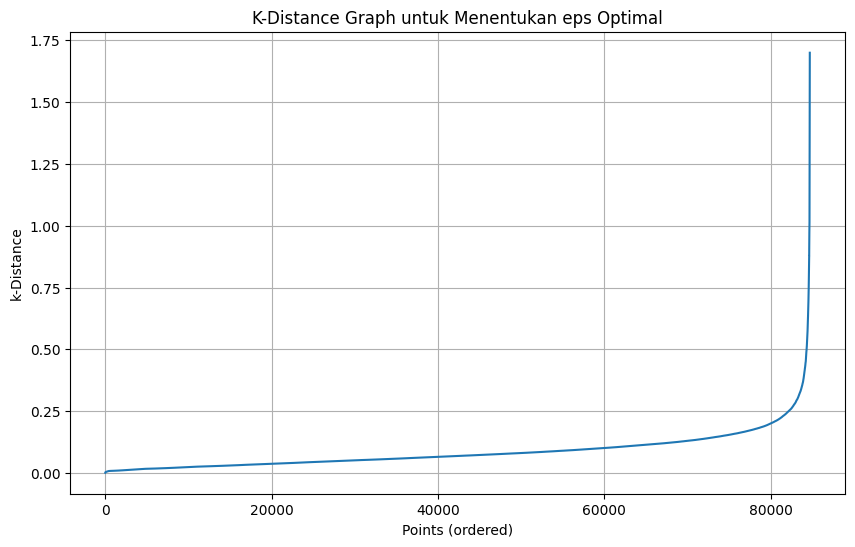

In [ ]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

# Gunakan data hasil normalisasi
X = normalisasi_df_gempa.values

# Tentukan jumlah tetangga (min_samples biasanya = 4-10)
k = 5

# Fit nearest neighbors
neighbors = NearestNeighbors(n_neighbors=k)
neighbors_fit = neighbors.fit(X)
distances, indices = neighbors_fit.kneighbors(X)

# Ambil jarak tetangga ke-k (k-distance)
k_distances = np.sort(distances[:, k - 1])

# Plot k-distance graph
plt.figure(figsize=(10, 6))
plt.plot(k_distances)
plt.title("K-Distance Graph untuk Menentukan eps Optimal")
plt.ylabel(f"k-Distance")
plt.xlabel("Points (ordered)")
plt.grid(True)
plt.show()

In [ ]:
X = df_gempa[['latitude', 'longitude']]

In [ ]:
#Normalisasi / Standardisasi Data

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
# Clustering dengan DBSCAN
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.25, min_samples=5)
labels = dbscan.fit(X_scaled)

df_gempa['cluster'] = dbscan.labels_

In [ ]:
print(df_gempa['cluster'].value_counts())

cluster
 0    84681
-1       12
Name: count, dtype: int64


In [ ]:
from sklearn.metrics import silhouette_score

# Menghindari error jika hanya 1 cluster atau seluruhnya outlier
if len(set(df_gempa['cluster'])) > 1 and -1 in set(df_gempa['cluster']):
    score = silhouette_score(X_scaled, df_gempa['cluster'])
    print("Silhouette Score:", score)
else:
    print("Tidak cukup cluster untuk menghitung Silhouette Score")

Silhouette Score: 0.30618340916267045


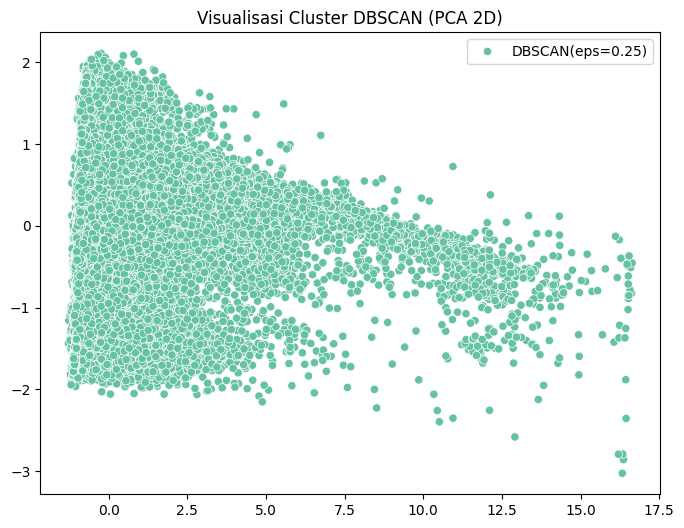

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
reduced = pca.fit_transform(normalisasi_df_gempa)

plt.figure(figsize=(8,6))
sns.scatterplot(x=reduced[:,0], y=reduced[:,1], hue=labels, palette="Set2")
plt.title("Visualisasi Cluster DBSCAN (PCA 2D)")
plt.show()

In [ ]:
def klasifikasi_db(x):
    if x == 0:
        return "Baik"
    elif x == -1:
        return "Noise"
    else:
        return "Kurang"

df_gempa['Klasifikasi_DBSCAN'] = df_gempa['cluster'].apply(klasifikasi_db)

print(df_gempa['Klasifikasi_DBSCAN'].value_counts())

Klasifikasi_DBSCAN
Baik     84681
Noise       12
Name: count, dtype: int64


In [ ]:
cluster_summary_db = df_gempa.drop(columns=['date', 'time']
                           ).groupby('Klasifikasi_DBSCAN').mean()

cluster_summary_db

,latitude,longitude,depth,magnitude,cluster
Klasifikasi_DBSCAN,,,,,
Baik,-3.422907,119.23506,48.485921,3.558536,0.0
Noise,-2.572500,112.81066,25.458333,5.438333,-1.0


In [ ]:
import plotly.express as px

# Buat dataframe PCA untuk visualisasi
df_gempa_pca_db = pd.DataFrame(reduced, columns=["PCA 1", "PCA 2"])
df_gempa_pca_db["Cluster_DBSCAN"] = labels

# Ambil kolom asli untuk hover info
df_gempa_pca_db["Latitude"] = df_gempa["latitude"].values
df_gempa_pca_db["Longitude"] = df_gempa["longitude"].values
df_gempa_pca_db["Magnitude"] = df_gempa["magnitude"].values
df_gempa_pca_db["Depth"] = df_gempa["depth"].values
df_gempa_pca_db["Date"] = df_gempa["date"].values
df_gempa_pca_db["Time"] = df_gempa["time"].values

# Plot interaktif
fig = px.scatter(
    df_gempa_pca_db,
    x="PCA 1",
    y="PCA 2",
    color="Cluster_DBSCAN",
    hover_data=["Date", "Time", "Latitude", "Longitude", "Magnitude", "Depth"],
    title="Visualisasi Cluster Gempa dengan DBSCAN (PCA 2D)",
    width=1400,
    height=800
)

fig.show()